# Imports

In [1]:
import json
import logging

import pandas as pd
import requests

import core.plotting.plotting_utils as cplpluti
import helpers.hdbg as hdbg
import helpers.hprint as hprint

/app/core/explore.py:39: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  import tqdm.autonotebook as tauton


In [2]:
hdbg.init_logger(verbosity=logging.INFO)

_LOG = logging.getLogger(__name__)

hprint.config_notebook()

INFO: > cmd='/venv/lib/python3.8/site-packages/ipykernel_launcher.py -f /home/.local/share/jupyter/runtime/kernel-62699dc2-5725-4a81-95e1-8f16edc29934.json'


# Functions

In [3]:
def _volume_transformer(vol_str):
    """
    Take the value of `Volume` and cut the end to the point where the first
    000's start.
    """
    vol_str_split = vol_str.split(",")
    last_piece = vol_str_split[-1]
    last_piece = last_piece[0:3]
    result = [p for p in vol_str_split[:-1]]
    result.append(last_piece)
    return ",".join(result)


def clean_up_exchanges(df):
    """
    - `Name` values contains integers at the end that we want to omit.
    - `Volume` values are presented not in a standard way.
    """
    # Names.
    df["Name"] = df["Name"].str.replace("\d+", "")
    # Volumes.
    df["Volume(24h)"] = df["Volume(24h)"].apply(lambda x: _volume_transformer(x))
    df["Volume(24h)"] = df["Volume(24h)"].apply(lambda x: x.replace("$", ""))
    df["Volume(24h)"] = df["Volume(24h)"].apply(lambda x: x.replace(".", ""))
    df["Volume(24h)"] = df["Volume(24h)"].apply(lambda x: x.replace(",", ""))
    df["Volume(24h)"] = pd.to_numeric(df["Volume(24h)"])
    return df


def get_cumulative_volume_ratios(
    df: pd.DataFrame, value_col: str, plot_results: bool, entity: str
) -> pd.Series:
    """
    :param df: Data with volume or market cap
    :param value_col: Specify volume or market cap column
    :param plot_results: plot barplot if True
    :param entity: "exchange" or "coin"
    :return: cumulative value ratios with respect to total sum of values
    """
    cumul_volume = df[value_col].cumsum() / df[value_col].sum()
    num_of_entities = len(cumul_volume[cumul_volume <= 0.9])
    print(
        f"Number of entities that is needed to consitute 90% of total sum: {num_of_entities}"
    )
    if plot_results:
        # TODO(max): plot as bars with the names of the exchanges at the bottom (vertically).
        # cumul_volume.plot(ylim=(0, 1))
        if entity == "exchange":
            plot_df = pd.concat([cumul_volume, df["Name"]], axis=1).set_index(
                "Name"
            )
            xlabel = "Exchanges"
        else:
            plot_df = pd.concat([cumul_volume, df["name"]], axis=1).set_index(
                "name"
            )
            xlabel = "Cryptocurrencies"
        if value_col == "_marketCap":
            title = "Cumulative Market Cap"
        else:
            title = "Cumulative trading volume"
        cplpluti.plot_barplot(
            plot_df.squeeze(),
            title=title,
            xlabel=xlabel,
            unicolor=True,
            annotation_mode="value",
            rotation=45,
        )
    return cumul_volume


def get_general_volume_ratio_df(
    df1: pd.DataFrame,
    df2: pd.DataFrame,
    value_col: str,
    col1: str,
    col2: str,
    plot_results: bool,
) -> pd.DataFrame:
    """
    Computes the portions of volume or market cap from two differen subsets
    with respect to full data.

    :param df1: Full data
    :param df2: Subset of full data that is ised for comparison
    :param value_col: Specify volume or market cap column
    :param col1: Name of the subset of full data
    :param col2: Name of the remaining subset of full data
    :param plot_results: Plot barplot if True
    :return: Ratio stats
    """
    value1 = df1[value_col].sum()
    value2 = df2[value_col].sum()
    ratio_df = pd.DataFrame()
    ratio_df.loc[col1, value_col] = value2
    ratio_df.loc[col2, value_col] = value1 - value2
    if plot_results:
        cplpluti.plot_barplot(ratio_df[value_col])
    return ratio_df

# Exchanges (Spot)

In [4]:
# Original data in /data/shared/CMTask1812_Compute_stats_for_investor_presentation
# cp -r /data/shared/CMTask1812_Compute_stats_for_investor_presentation .

dir_name = "../../../CMTask1812_Compute_stats_for_investor_presentation"

# Read .html file.
# It was downloaded 2022-05-03 from https://coinmarketcap.com/rankings/exchanges/.
# Contains the snapshot of a table with the descriptive statistics of cryptocurrency exhanges.
file_name_exch = (
    dir_name
    + "/"
    + "Top Cryptocurrency Exchanges Ranked By Volume _ CoinMarketCap.html"
)
file_exch = pd.read_html(file_name_exch)
# Select necessary columns with top-100.
exch_df = file_exch[0][["Name", "Volume(24h)", "Exchange Score", "#"]].loc[:99]

ImportError: html5lib not found, please install it

In [5]:
# Clean up the data.
all_exch = clean_up_exchanges(exch_df)

/tmp/ipykernel_777/1007047735.py:20: FutureWarning: The default value of regex will change from True to False in a future version.
  df["Name"] = df["Name"].str.replace("\d+", "")


In [6]:
# Select only `good` exchanges.
# Note: `good` exchanges - the ones with the Score > 6.
# `All` exchanges - `good` exchanges + the remaining ones.
good_exch = all_exch[all_exch["Exchange Score"] > 6]
_LOG.info(good_exch.shape)

INFO  (25, 4)


## Top-10 `good` exchanges by volume

,Name,Volume(24h),Exchange Score,#
0,Binance,13223039603,9.9,1
1,OKX,2838184982,6.4,19
2,KuCoin,1880203510,7.6,5
3,Crypto.com Exchange,1872218038,6.9,12
4,Coinbase Exchange,1826930616,8.3,2
5,LBank,1709267943,6.3,20
6,MEXC,1630620762,6.5,18
7,Huobi Global,1546408433,7.3,6
8,FTX,1420693961,8.2,3
9,Gate.io,1405199254,7.3,7


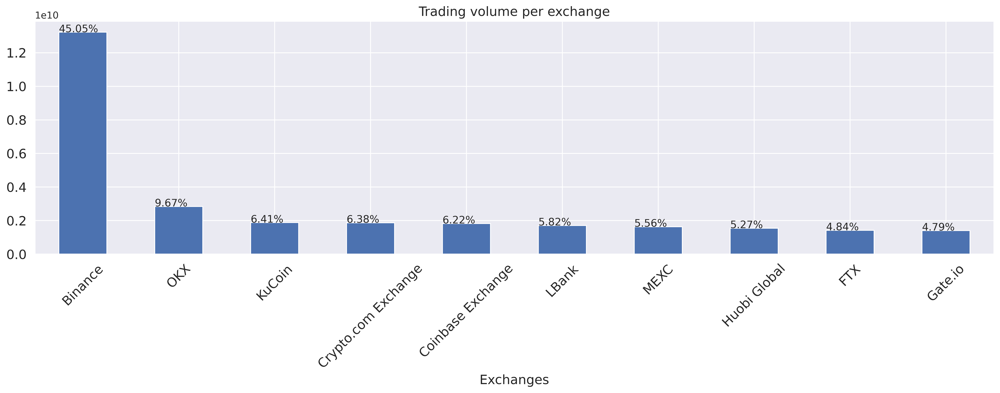

In [7]:
# Sort by volume.
good_exch = good_exch.sort_values(
    ["Volume(24h)"], ascending=False, ignore_index=True
)
# Plot .
display(good_exch.loc[:9])
cplpluti.plot_barplot(
    good_exch.set_index("Name")["Volume(24h)"].iloc[:10].squeeze(),
    title="Trading volume per exchange",
    xlabel="Exchanges",
    unicolor=True,
    rotation=45,
)

## Total volume of top-10 `good` exchanges vs. other `good` exchanges

,Volume(24h)
Top-10 `good` exchanges,2.935277e+10
Other `good` exchanges,3.271221e+09


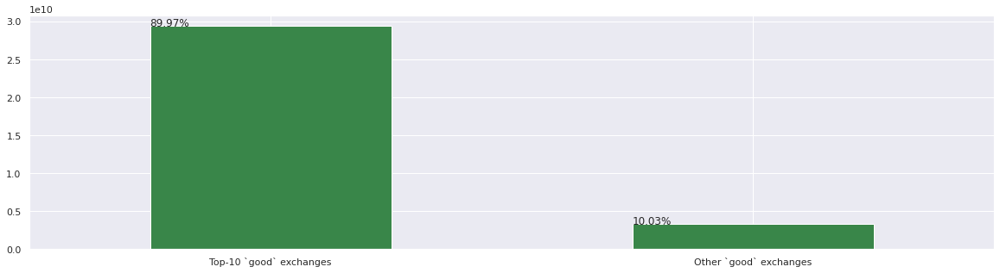

In [8]:
ratio_good = get_general_volume_ratio_df(
    good_exch,
    good_exch.loc[:9],
    "Volume(24h)",
    "Top-10 `good` exchanges",
    "Other `good` exchanges",
    plot_results=True,
)
display(ratio_good)

## Cumulative volume for all `good` exchanges

Number of entities that is needed to consitute 90% of total sum: 10


0    0.405316
1    0.492313
2    0.549946
3    0.607334
4    0.663333
Name: Volume(24h), dtype: float64

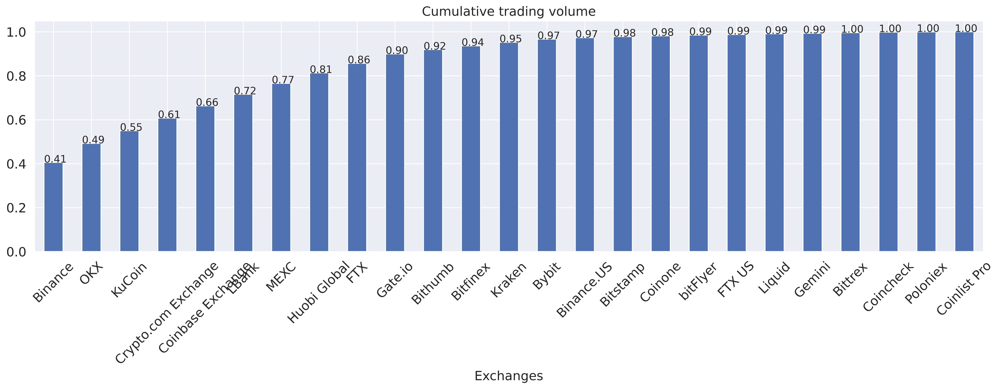

In [8]:
good_cumul_volume = get_cumulative_volume_ratios(
    good_exch, "Volume(24h)", plot_results=True, entity="exchange"
)
display(good_cumul_volume.head(5))

## Total volume of `good` exchanges vs. all other exchanges

,Volume(24h)
`Good` exchanges,3.262399e+10
Other exchanges,4.871051e+10


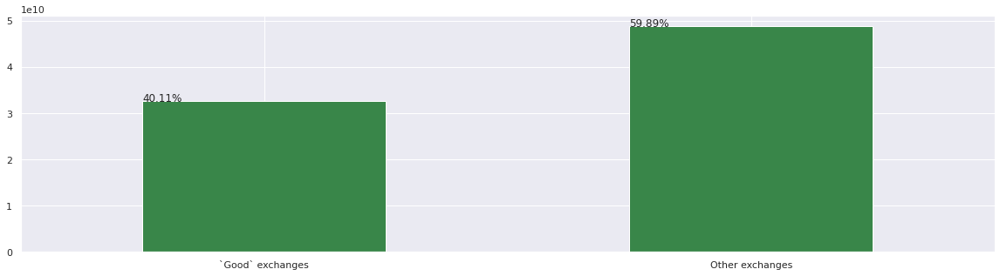

In [10]:
ratio_all = get_general_volume_ratio_df(
    all_exch,
    good_exch,
    "Volume(24h)",
    "`Good` exchanges",
    "Other exchanges",
    plot_results=True,
)
display(ratio_all)

## Cumulative volume of all exchanges

Number of entities that is needed to consitute 90% of total sum: 26


0    0.170559
1    0.236440
2    0.296901
3    0.346650
4    0.393768
Name: Volume(24h), dtype: float64

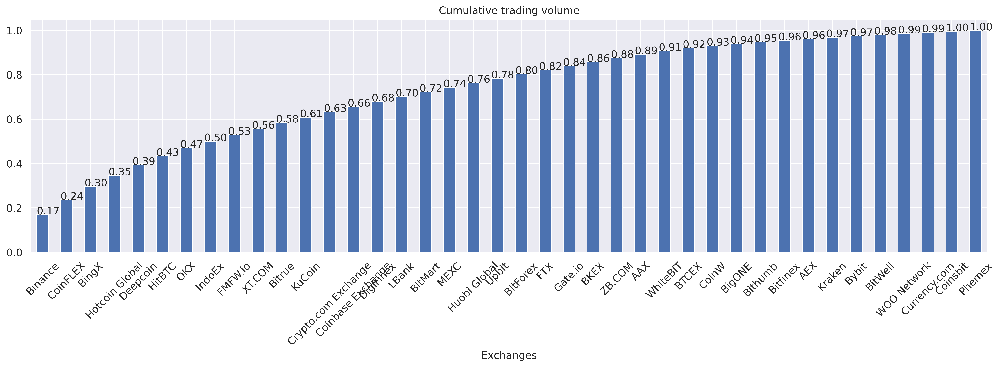

In [7]:
# Sort all exchanges by volume.
all_exch_sorted = all_exch.sort_values(
    ["Volume(24h)"], ascending=False, ignore_index=True
)
# Plot the results.
all_cumul_volume = get_cumulative_volume_ratios(
    all_exch_sorted[:40], "Volume(24h)", plot_results=True, entity="exchange"
)
display(all_cumul_volume.head(5))

# Exchanges (Derivatives)

In [ ]:
# Read .html file.
# It was downloaded 2022-05-03 from https://coinmarketcap.com/rankings/exchanges/derivatives/.
# Contains the snapshot of a table with the descriptive statistics of cryptocurrency derivatives exhanges.
file_name_der = (
    dir_name
    + "/"
    + "Top Cryptocurrency Derivatives Exchanges Ranked _ CoinMarketCap.html"
)
file_der = pd.read_html(file_name_der)
# Select necessary columns with top-100.
exch_der_df = file_der[0][["#", "Name", "Volume(24h)"]]

In [9]:
# Clean up.
exch_der_df = clean_up_exchanges(exch_der_df)
# Sorting.
exch_der_df = exch_der_df.sort_values("Volume(24h)", ascending=False)

/tmp/ipykernel_777/1007047735.py:20: FutureWarning: The default value of regex will change from True to False in a future version.
  df["Name"] = df["Name"].str.replace("\d+", "")
/tmp/ipykernel_777/1007047735.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Name"] = df["Name"].str.replace("\d+", "")
/tmp/ipykernel_777/1007047735.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Volume(24h)"] = df["Volume(24h)"].apply(lambda x: _volume_transformer(x))
/tmp/ipykernel_777/1007047735.py:23: Sett

## Top-10 derivative exchanges by volume

,#,Name,Volume(24h)
0,1,Binance,43654726459
1,2,OKX,12998234107
2,3,MEXC,10046639242
3,4,Bybit,7822684658
4,5,CoinTiger,6825198430
5,6,Bitget,6494153410
6,7,FTX,5326086694
7,8,BitCoke,5119894168
8,9,BTCEX,4743783465
9,10,Phemex,4520073571


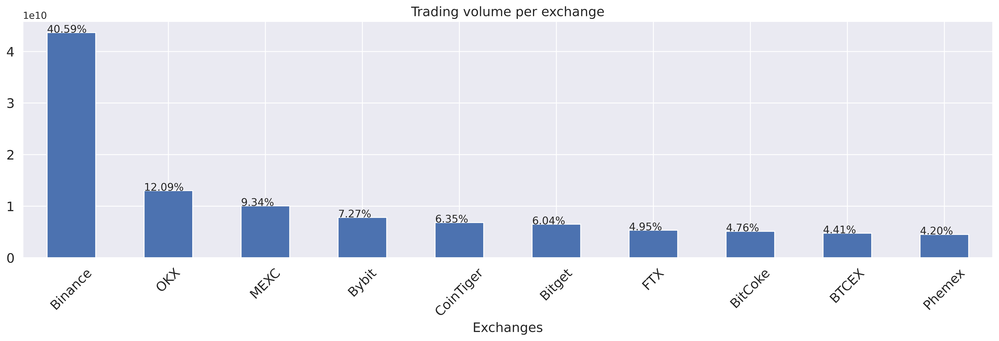

In [14]:
display(exch_der_df.loc[:9])
cplpluti.plot_barplot(
    exch_der_df.set_index("Name")["Volume(24h)"].iloc[:10].squeeze(),
    title="Trading volume per exchange",
    xlabel="Exchanges",
    unicolor=True,
    rotation=45,
)

## Total volume of top-10 derivative exchanges vs. all other derivative exchanges

,Volume(24h)
Top-10 exchanges,1.075515e+11
Other exchanges,2.860544e+10


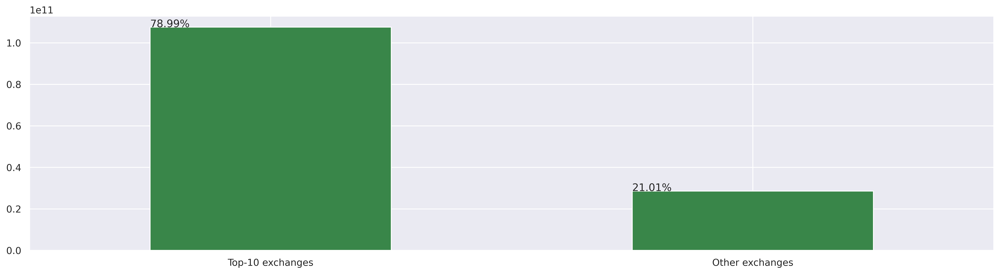

In [15]:
ratio_der = get_general_volume_ratio_df(
    exch_der_df,
    exch_der_df.loc[:9],
    "Volume(24h)",
    "Top-10 exchanges",
    "Other exchanges",
    plot_results=True,
)
display(ratio_der)

## Cumulative volume of all derivative exchanges

Number of entities that is needed to consitute 90% of total sum: 14


0    0.320799
1    0.416317
2    0.490145
3    0.547630
4    0.597786
Name: Volume(24h), dtype: float64

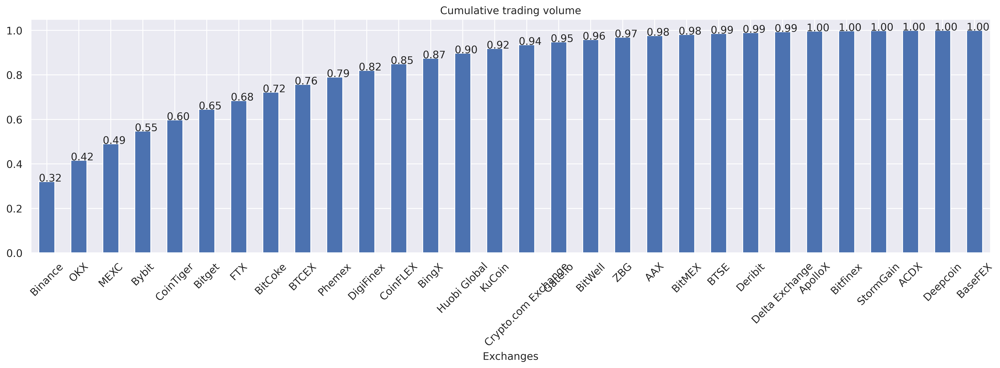

In [10]:
all_cumul_der_volume = get_cumulative_volume_ratios(
    exch_der_df[:30], "Volume(24h)", plot_results=True, entity="exchange"
)
display(all_cumul_der_volume.head(5))

# Cryptocurrencies

In [4]:
# Load and process the data.
# It is updated with every re-run and is taken from Coinmarketcap API.
# Contains descriptive statistics about cryptocurrencies.
url = "https://api.coinmarketcap.com/data-api/v3/cryptocurrency/listing?start=1&limit=10081&sortBy=market_cap&sortType=desc&convert=USD&cryptoType=all&tagType=all&audited=false&aux=name,volume_24h"
response = requests.get(url)

crypto_data = json.loads(response.text)
crypto_df = pd.json_normalize(
    crypto_data["data"]["cryptoCurrencyList"],
    "quotes",
    ["name"],
    record_prefix="_",
)
_LOG.info(crypto_df.shape)
crypto_df.head(3)

INFO  (10081, 18)


,_name,_price,_volume24h,_marketCap,_percentChange1h,_percentChange24h,_percentChange7d,_lastUpdated,_percentChange30d,_percentChange60d,_percentChange90d,_fullyDilluttedMarketCap,_marketCapByTotalSupply,_dominance,_turnover,_ytdPriceChangePercentage,_tvl,name
0,USD,31426.740715,8.225587e+10,5.982376e+11,-1.331305,-5.931636,-18.290809,2022-05-10T10:15:00.000Z,-26.117451,-19.572884,-27.863481,6.599616e+11,5.982376e+11,41.4360,0.137497,-34.0976,NaN,Bitcoin
1,USD,2375.484119,4.692017e+10,2.867692e+11,-0.601888,-2.592448,-16.151145,2022-05-10T10:14:00.000Z,-26.697750,-8.763248,-23.767626,2.867692e+11,2.867692e+11,19.8581,0.163617,-36.9847,NaN,Ethereum
2,USD,0.999900,1.645209e+11,8.315888e+10,-0.011187,0.003053,-0.009258,2022-05-10T10:14:00.000Z,-0.040643,-0.055186,-0.073526,8.670528e+10,8.670528e+10,5.7587,1.978392,-0.0600,NaN,Tether


In [5]:
# Leave only necessary columns.
crypto_df = crypto_df[["name", "_volume24h", "_marketCap"]].sort_values(
    "_marketCap", ascending=False, ignore_index=True
)
# `Good` crypto = first 100 coins by market cap
good_crypto = crypto_df.iloc[:100]

## Market Cap

### Top-10 `good` cryptocurrencies by Market Cap

In [7]:
cplpluti.configure_notebook_for_presentation()

,name,_volume24h,_marketCap
0,Bitcoin,8.225587e+10,5.982376e+11
1,Ethereum,4.692017e+10,2.867692e+11
2,Tether,1.645209e+11,8.315888e+10
3,BNB,3.938556e+09,5.233206e+10
4,USD Coin,1.067364e+10,4.845006e+10
5,HEX,3.468966e+07,2.670306e+10
6,XRP,4.496877e+09,2.501651e+10
7,Solana,4.234400e+09,2.320326e+10
8,Cardano,2.993452e+09,2.257131e+10
9,Binance USD,1.049807e+10,1.733875e+10


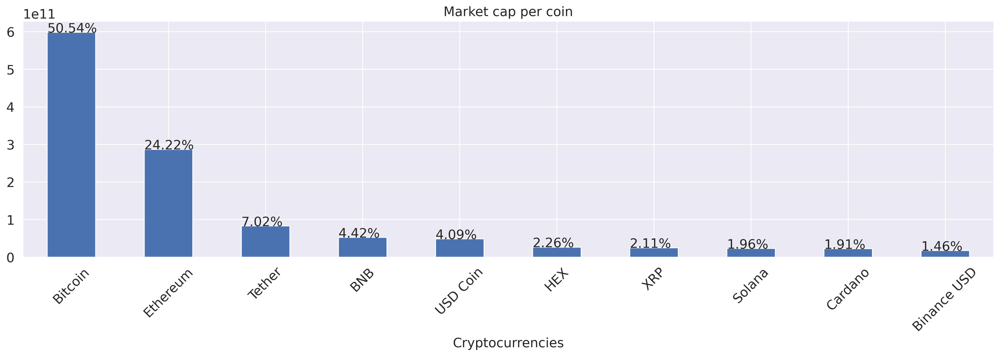

In [8]:
display(good_crypto.loc[:9])
cplpluti.plot_barplot(
    good_crypto.set_index("name")["_marketCap"].iloc[:10].squeeze(),
    title="Market cap per coin",
    xlabel="Cryptocurrencies",
    unicolor=True,
    rotation=45,
)

### Total market cap of top-10 `good` cryptocurrencies vs. other `good` cryptocurrencies

,_marketCap
Top-10 cryptocurrencies,1.203682e+12
Other `good` cryptocurrencies,2.887654e+11


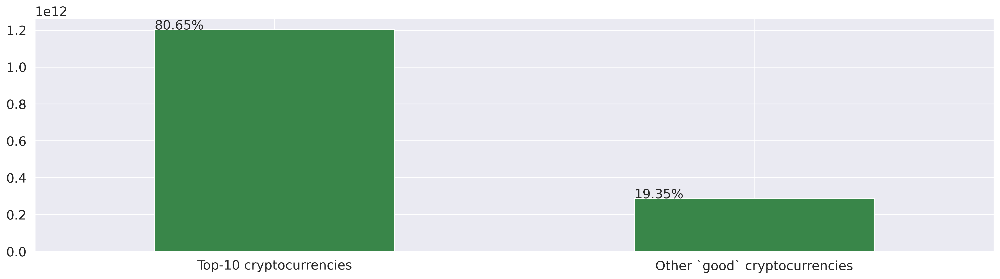

In [7]:
ratio_cc = get_general_volume_ratio_df(
    good_crypto,
    good_crypto.iloc[:10],
    "_marketCap",
    "Top-10 cryptocurrencies",
    "Other `good` cryptocurrencies",
    plot_results=True,
)
display(ratio_cc)

### Cumulative market cap of all `good` cryptocurrencies

Number of entities that is needed to consitute 90% of total sum: 14


0    0.436463
1    0.639422
2    0.698355
3    0.735848
4    0.770270
Name: _marketCap, dtype: float64

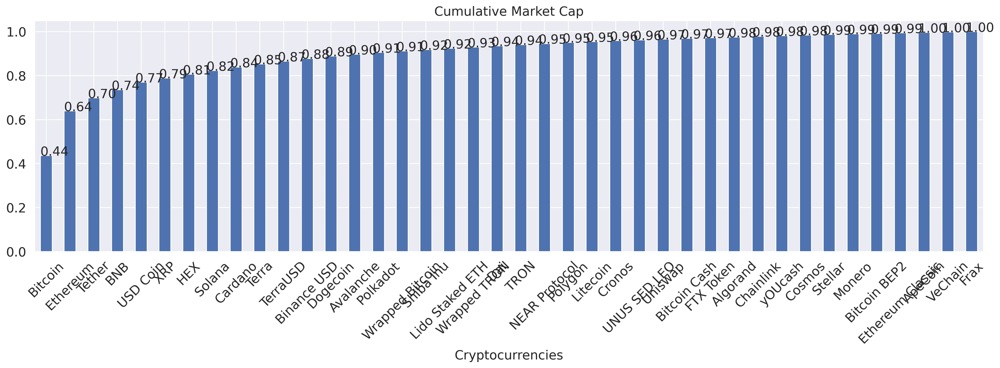

In [8]:
good_cumul_mcap = get_cumulative_volume_ratios(
    good_crypto[:40], "_marketCap", plot_results=True, entity="coin"
)
display(good_cumul_mcap.head(5))

## Volume

### Top-10 `good` cryptocurrencies by volume

,name,_volume24h,_marketCap
0,Tether,9.494414e+10,8.322075e+10
1,Bitcoin,5.033735e+10,6.163365e+11
2,Ethereum,2.757061e+10,2.866009e+11
3,USD Coin,6.374620e+09,4.860771e+10
4,Binance USD,6.292906e+09,1.731461e+10
5,Terra,4.439026e+09,1.968009e+10
6,Bitcoin Cash,3.907516e+09,4.599773e+09
7,TRON,2.850493e+09,7.605878e+09
8,BNB,2.287139e+09,5.294499e+10
9,XRP,2.243733e+09,2.542952e+10


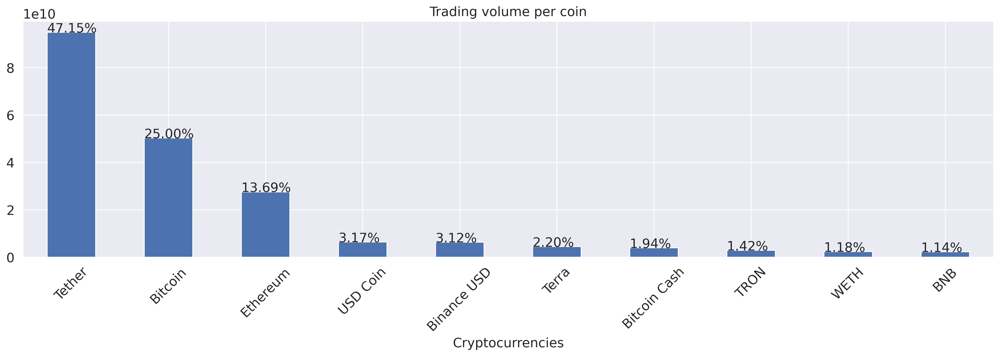

In [9]:
good_crypto_volume_sorted = good_crypto.sort_values(
    "_volume24h", ascending=False, ignore_index=True
)
display(good_crypto_volume_sorted.iloc[:10])
cplpluti.plot_barplot(
    crypto_df.set_index("name")
    .sort_values("_volume24h", ascending=False)["_volume24h"]
    .iloc[:10]
    .squeeze(),
    title="Trading volume per coin",
    xlabel="Cryptocurrencies",
    unicolor=True,
    rotation=45,
)

### Total volume of top-10 `good` cryptocurrencies vs. other `good` cryptocurrencies

,_volume24h
Top-10 cryptocurrencies,2.012475e+11
Other `good` cryptocurrencies,2.886008e+10


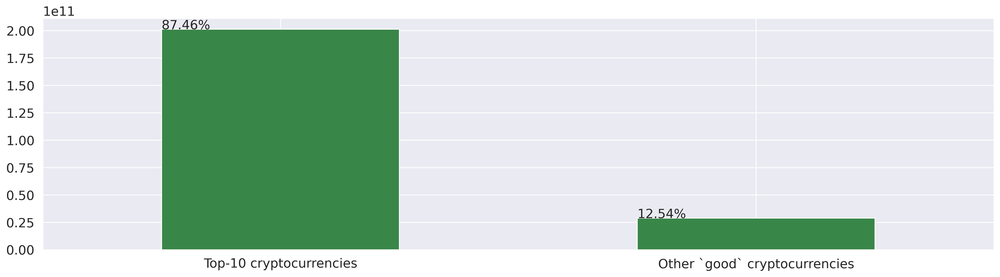

In [12]:
ratio_good_volume = get_general_volume_ratio_df(
    good_crypto_volume_sorted,
    good_crypto_volume_sorted.iloc[:10],
    "_volume24h",
    "Top-10 cryptocurrencies",
    "Other `good` cryptocurrencies",
    plot_results=True,
)
display(ratio_good_volume)

### Cumulative volume of all `good` cryptocurrencies

Number of entities that is needed to consitute 90% of total sum: 10


0    0.422728
1    0.646850
2    0.769605
3    0.797987
4    0.826006
Name: _volume24h, dtype: float64

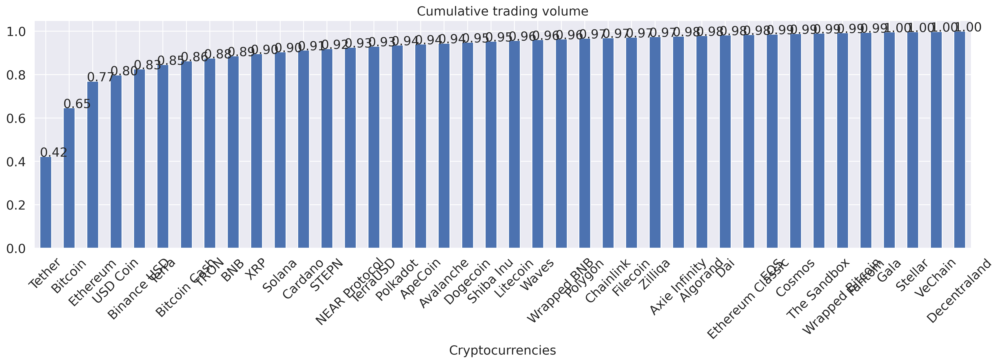

In [14]:
# Plot the cumulative volume against exchanges.
all_cumul_cc_volume = get_cumulative_volume_ratios(
    good_crypto_volume_sorted[:40], "_volume24h", plot_results=True, entity="coin"
)
display(all_cumul_cc_volume.head(5))

## `Good` vs. `Others` Crypto

- `good` crypto = first 100 coins by market cap
- `other` crypto = coins outside `good` crypto (±10.000 entities)

### Market Cap

#### Total market cap of all `good` cryptocurrencies vs. other cryptocurrencies

,_marketCap
`Good` cryptocurrencies,1.661297e+12
Other cryptocurrencies,9.095144e+10


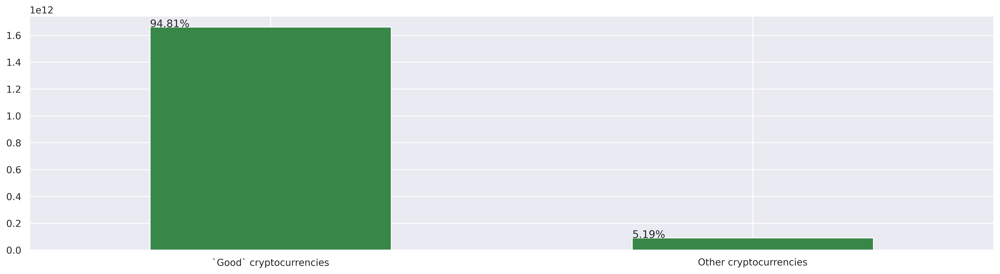

In [25]:
ratio_good_vs_others_mcap = get_general_volume_ratio_df(
    crypto_df,
    good_crypto,
    "_marketCap",
    "`Good` cryptocurrencies",
    "Other cryptocurrencies",
    plot_results=True,
)
display(ratio_good_vs_others_mcap)

#### Cumulative market cap of all cryptocurrencies

Number of entities that is needed to consitute 90% of total sum: 14


0    0.434736
1    0.640703
2    0.693672
3    0.732742
4    0.763808
Name: _marketCap, dtype: float64

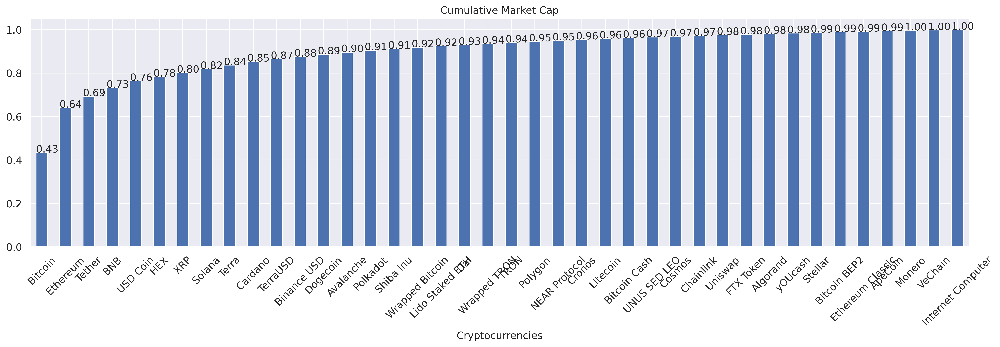

In [17]:
# Plot the cumulative volume against exchanges.
good_others_mcap = get_cumulative_volume_ratios(
    crypto_df[:40], "_marketCap", plot_results=True, entity="coin"
)
display(good_others_mcap.head(5))

### Volume

#### Total volume of all `good` cryptocurrencies vs. other cryptocurrencies

,_volume24h
`Good` cryptocurrencies,2.461980e+11
Other cryptocurrencies,2.081539e+10


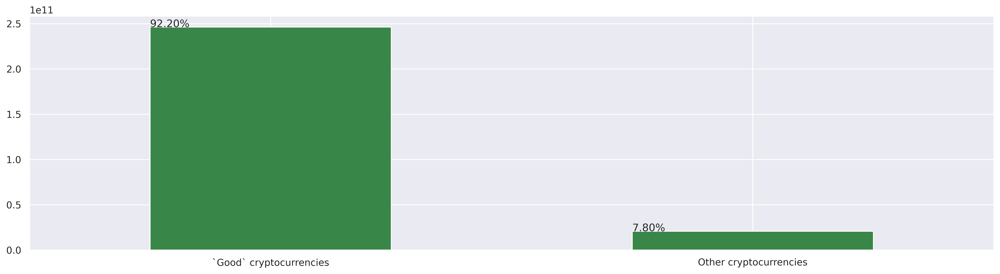

In [27]:
ratio_good_vs_others_mcap = get_general_volume_ratio_df(
    crypto_df,
    good_crypto,
    "_volume24h",
    "`Good` cryptocurrencies",
    "Other cryptocurrencies",
    plot_results=True,
)
display(ratio_good_vs_others_mcap)

#### Cumulative volume of all cryptocurrencies

Number of entities that is needed to consitute 90% of total sum: 12


0    0.419972
1    0.640507
2    0.757153
3    0.784048
4    0.810423
Name: _volume24h, dtype: float64

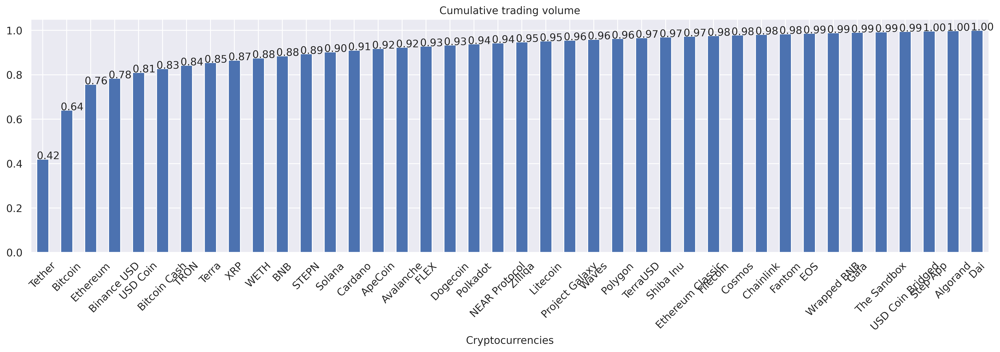

In [18]:
# Plot the cumulative volume against exchanges.
good_others_volume = get_cumulative_volume_ratios(
    crypto_df.sort_values("_volume24h", ascending=False, ignore_index=True)[:40],
    "_volume24h",
    plot_results=True,
    entity="coin",
)
display(good_others_volume.head(5))